In [1]:
# This notebook is for voxel-wise correlation of functional and structural gradients (multimodal - struct x func).

# Includes:
#     laoding gradient data
#     checking and saving resampled (to 1.6mm matching func) diffusion gradients
#     BF color coding by coordinate system
#     gradient correlations (struct x func)
#     joint fig of gradient correlation and distribution histogram
#     residuals calculation ie BF subregion most different in struct vs. func gradients

In [1]:
import os
from numpy import load
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm
import pandas as pd
import nibabel as nib
import matplotlib as mpl
import matplotlib.pyplot as plt
import pylab as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import linregress
from copy import copy
import pingouin as pg

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


### Setting the path

In [2]:
main_path = "/srv/khan/users/sudesnac/00_Projects/"
#main_path = "/home/ROBARTS/schakraborty/graham/sudesnacPJ/21_Codes/"

In [3]:
# get the current notebook path
note_path = main_path + "/HumanBF-Parcellation/notebook/"
data_path = main_path + "/HumanBF-Parcellation/data/"
results_path = main_path + "/HumanBF-Parcellation/results/Grad_corr/"
fig_path = main_path + "/HumanBF-Parcellation/results/Grad_corr/figures/"

In [4]:
Func_results = main_path + "HumanBF-Parcellation/results/Func_HCPMMP/"
Diff_results = main_path + "HumanBF-Parcellation/results/Diff_7Tsubj/"
Fuse_results = main_path + "HumanBF-Parcellation/results/Fusion_grad/"

### Loading BF gradient data (nii files)

In [5]:
rfmri_fname = (Func_results + 'Func_HCPMMP_gradient_{0}.nii.gz')
dmri_fname = (Diff_results + 'Diff_7Tsubj_gradient_{0}.nii.gz')

In [6]:
rfmri_g1_nii  = nib.load(rfmri_fname.format(1))
dmri_g1_nii = nib.load(dmri_fname.format(1))

In [7]:
rfmri_g1 = rfmri_g1_nii.get_fdata()
rfmri_mask = np.where(rfmri_g1, 1, 0)

dmri_g1  = dmri_g1_nii.get_fdata()
dmri_mask = np.where(dmri_g1, 1, 0)

#### Creating combined mask and color-coded BF

In [9]:
combined_mask = np.zeros_like(dmri_mask)
combined_mask[(dmri_mask==1) & (rfmri_mask==1)] = 1

In [10]:
# Get X, Y, Z coordinates
ijk_indices = np.argwhere(combined_mask)
ijk_indices = np.hstack((ijk_indices,np.ones((len(ijk_indices),1))))

affine = rfmri_g1_nii.affine

xyz_coords = np.dot(ijk_indices, affine)

In [11]:
# Here we flip along the X axis to give left and right same color codes
new_ijk_indices = ijk_indices.copy()
new_ijk_indices[:,0] = np.abs((combined_mask.shape[0]/2)-ijk_indices[:,0])

In [12]:
# Create RGB array
min_max_scaler = preprocessing.MinMaxScaler()

c_com = np.zeros((len(new_ijk_indices),3))
c_com[:,0] = min_max_scaler.fit_transform(new_ijk_indices[:,0][:,np.newaxis])[:,0]
c_com[:,1] = min_max_scaler.fit_transform(new_ijk_indices[:,1][:,np.newaxis])[:,0]
c_com[:,2] = min_max_scaler.fit_transform(new_ijk_indices[:,2][:,np.newaxis])[:,0]

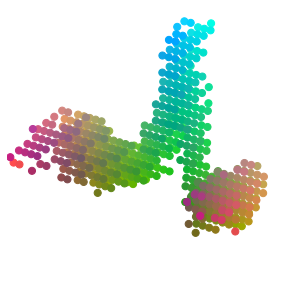

In [12]:
# combined functional x diffusion mask for func vs. diff correlation
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    c=c_com
)

plt.savefig(fig_path + f'BF_corr-color-ref_scatterplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Gradient Correlation structural vs functional - s6 x f4

#### Linear least-square regression

In [13]:
r2_matrix = np.zeros((6,4))
r_matrix = np.zeros((6,4))
p_matrix = np.zeros((6,4))
reg_results = pd.DataFrame()
dmri_rescaled = pd.DataFrame()
rfmri_rescaled = pd.DataFrame()

for g in range(6):
    dmri_g = nib.load(dmri_fname.format(g+1)).get_fdata()
    dmri_g_rescaled = min_max_scaler.fit_transform(dmri_g[combined_mask==1][:,np.newaxis])
    dmri_rescaled[g] = pd.DataFrame(dmri_g_rescaled)

    for gg in range(4):
        rfmri_g = nib.load(rfmri_fname.format(gg+1)).get_fdata()
        rfmri_g_rescaled = min_max_scaler.fit_transform(rfmri_g[combined_mask==1][:,np.newaxis])
        rfmri_rescaled[gg] = pd.DataFrame(rfmri_g_rescaled)
        
        res = linregress(dmri_g[combined_mask==1].flatten(), rfmri_g[combined_mask==1].flatten())
        
        reg_results[g,gg] = pd.DataFrame(res)
        r2_matrix[g,gg] = res.rvalue**2
        r_matrix[g,gg] = res.rvalue
        p_matrix[g,gg] = res.pvalue
        
index = pd.Index(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'])
reg_results = reg_results.set_index(index)       

In [15]:
pd.DataFrame(reg_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_results_s6-f4_scipy.csv', index=False)
pd.DataFrame(dmri_rescaled).to_csv(results_path + 'BF_Structural_gradients_rescaled-0to1.csv', index=False)
pd.DataFrame(rfmri_rescaled).to_csv(results_path + 'BF_Functional_gradients_rescaled-0to1.csv', index=False)

In [14]:
# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis

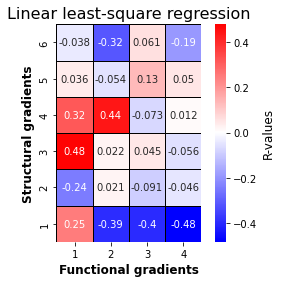

In [15]:
# plot r-values
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(r_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-values'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-values.png', dpi=300)
plt.show()

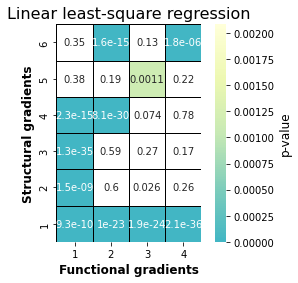

In [16]:
# plot significant p-values
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(p_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.invert_yaxis()
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_p-values.png', dpi=300)
plt.show()

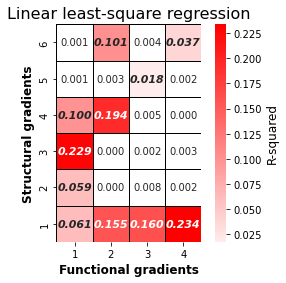

In [17]:
pval = 0.05/24

# plot r-squared
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(r2_matrix, mask=p_matrix < pval, cmap=ListedColormap(['white']), center=0, linewidth=1, linecolor='black', square=True,
           cbar=False,annot = True, fmt=".3f",
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax = sns.heatmap(r2_matrix, mask=p_matrix > pval, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
            cbar_kws={'label':'R-squared'}, annot = True, fmt=".3f", annot_kws={'fontsize':11,"weight": "bold", 'fontstyle':'italic'},
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_scipy-sigbold.png', dpi=300)
plt.show()

In [14]:
# average of R-squared over all 5x5 gradients
print(r2_matrix.mean())
print(r_matrix.mean())
print(r2_matrix.min())
print(r2_matrix.max())

0.057601173392632564
-0.022033369494188344
0.00013694880232730503
0.23364994492057692


#### Spearman correlation

In [22]:
from scipy import stats
spearmanr_matrix = np.zeros((6,4))
spearmanp_matrix = np.zeros((6,4))
spearmanr2_matrix = np.zeros((6,4))

for g in range(6):
    dmri_g = nib.load(dmri_fname.format(g+1)).get_fdata()
    dmri_g_rescaled = min_max_scaler.fit_transform(dmri_g[combined_mask==1][:,np.newaxis])    

    for gg in range(4):
        rfmri_g = nib.load(rfmri_fname.format(gg+1)).get_fdata()
        rfmri_g_rescaled = min_max_scaler.fit_transform(rfmri_g[combined_mask==1][:,np.newaxis])
        
        spearmanr, spearmanp = stats.spearmanr(dmri_g[combined_mask==1].flatten(), rfmri_g[combined_mask==1].flatten())
        
        spearmanr_matrix[g,gg] = spearmanr
        spearmanp_matrix[g,gg] = spearmanp
        spearmanr2_matrix[g,gg] = spearmanr**2

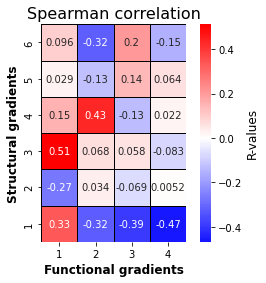

In [23]:
# plot pearson r-values
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(spearmanr_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-values'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation_s6-f4_R-values.png', dpi=300)
plt.show()

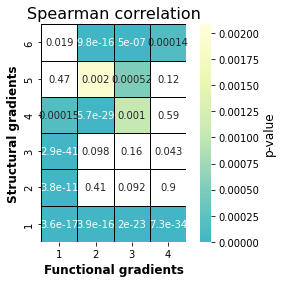

In [24]:
# plot pearson p-values
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(spearmanp_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation__s6-f4_p-values.png', dpi=300)
plt.show()

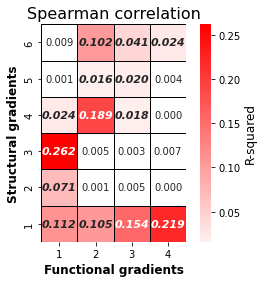

In [25]:
pval = 0.05/24

# plot r-squared
fig, ax = plt.subplots(1,1, figsize=(5,4))
sns.heatmap(spearmanr2_matrix, mask=spearmanp_matrix < pval, cmap=ListedColormap(['white']), center=0, linewidth=1, linecolor='black', square=True,
           cbar=False,annot = True, fmt=".3f",
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax = sns.heatmap(spearmanr2_matrix, mask=spearmanp_matrix > pval, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
            cbar_kws={'label':'R-squared'}, annot = True, fmt=".3f", annot_kws={'fontsize':11,"weight": "bold", 'fontstyle':'italic'},
            xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Spearman correlation', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_spearman_correlation_s6-f4_R-squared_scipy-sigbold.png', dpi=300)
plt.show()

In [26]:
# average of R over all 5x5 gradients
print(spearmanr_matrix.mean())
# average of R-squared over all 5x5 gradients
print(spearmanr2_matrix.mean())

-0.007502561403900588
0.0579835787885479


### Structural vs Functional gradient correlations

#### Correlation SG1 vs. FG1 (specify G)

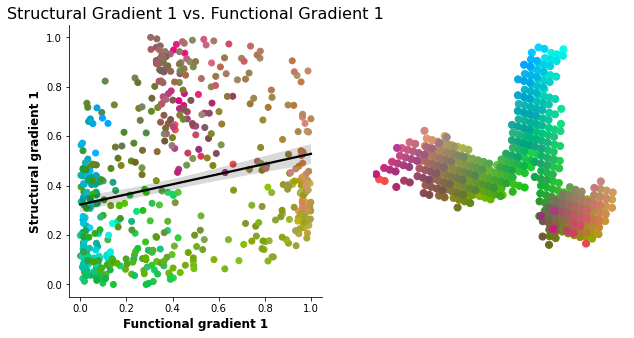

In [41]:
# Plot scatterplot colorcoded for XYZ coordinates
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(1,2,1)

ax1.scatter(rfmri_rescaled, dmri_rescaled, c=c_com)

ax1.set_xlabel('Functional gradient 1', weight='bold', fontsize=12)
ax1.set_ylabel('Structural gradient 1', weight='bold', fontsize=12)

plt.title("Structural Gradient 1 vs. Functional Gradient 1", fontsize=16)
# Add fit line
sns.regplot(
    x=rfmri_rescaled,
    y=dmri_rescaled,
    scatter=False, line_kws={'color': 'black'},
    ax=ax1)
sns.despine()

# Add 3D scatterplot for visualizing RGB values
ax2 = fig.add_subplot(1,2,2, projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    c=c_com
)

plt.show()

#### Structural vs Functional correlation for G1 to G6

In [19]:
# load the data
struct_rescaled = pd.read_csv(results_path + 'BF_Structural_gradients_rescaled-0to1.csv')
func_rescaled = pd.read_csv(results_path + 'BF_Functional_gradients_rescaled-0to1.csv')

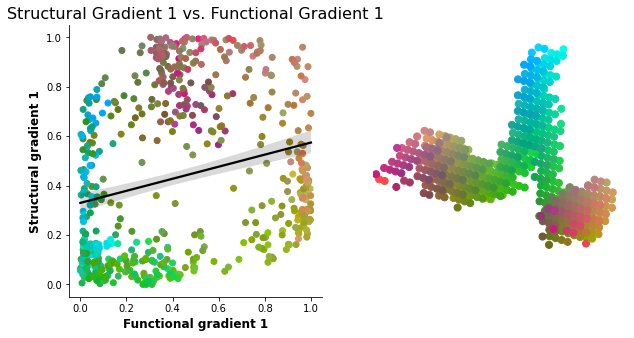

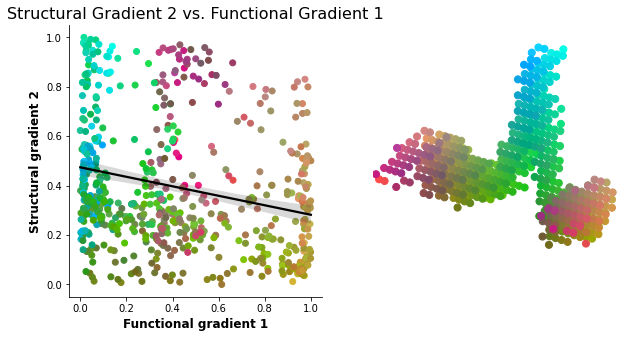

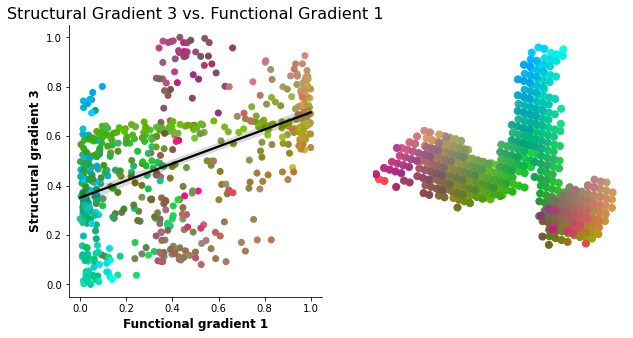

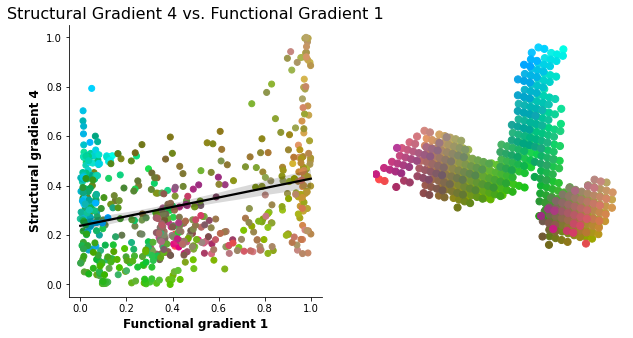

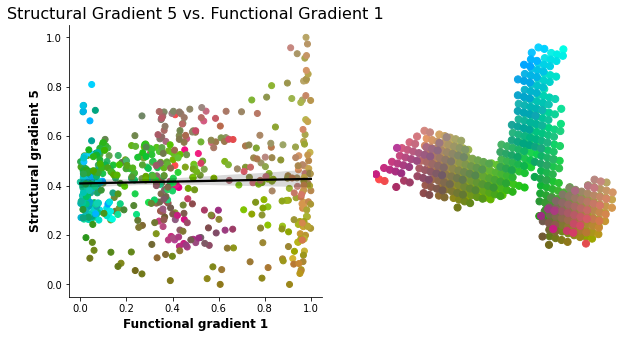

...

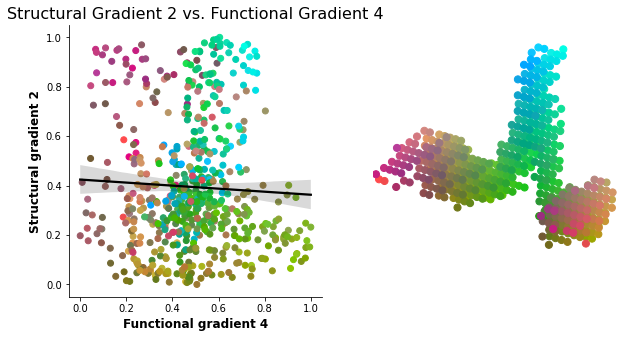

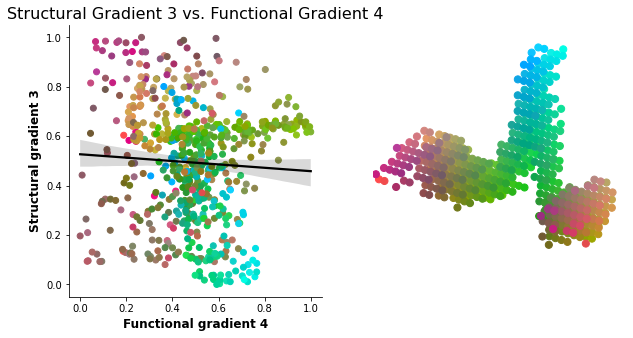

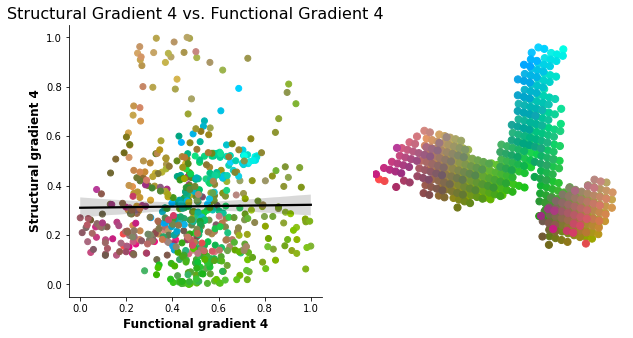

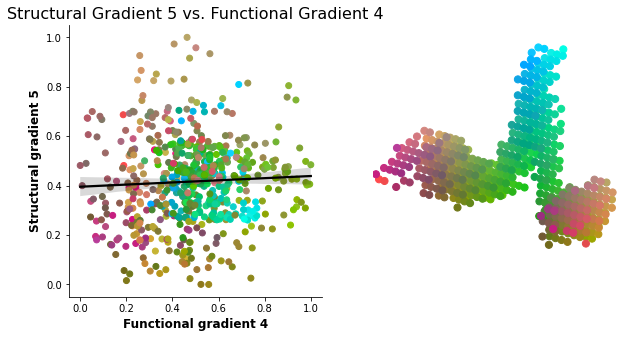

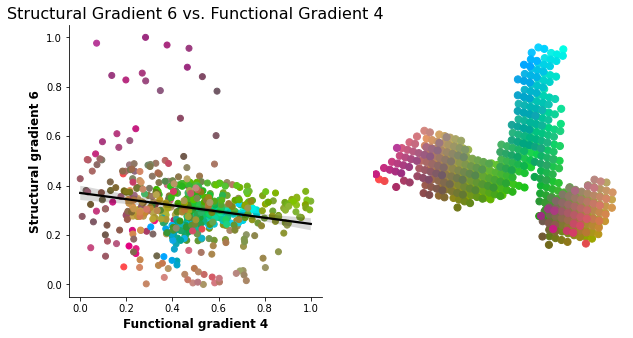

In [29]:
for fg in range(0,4):
    for dg in range(0,6):
        # Plot scatterplot colorcoded for XYZ coordinates
        fig = plt.figure(figsize=(10,5))
        ax1 = fig.add_subplot(1,2,1)
        
        x=func_rescaled[str(fg)].to_numpy()
        y=struct_rescaled[str(dg)].to_numpy()
        
        ax1.scatter(x,y,c=c_com)
        
        ax1.set_xlabel("Functional gradient "+str(fg+1), weight='bold', fontsize=12)
        ax1.set_ylabel("Structural gradient "+str(dg+1), weight='bold', fontsize=12)

        plt.title("Structural Gradient " + str(dg+1) + " vs. Functional Gradient " + str(fg+1), fontsize=16)
        
        # Add fit line
        sns.regplot(
            x=x,
            y=y,
            scatter=False, line_kws={'color': 'black'},
            ax=ax1)
        sns.despine()
                
        # Add 3D scatterplot for visualizing RGB values
        ax2 = fig.add_subplot(1,2,2, projection='3d')
        ax2.dist=6
        ax2.set_axis_off()
        ax2.scatter(ijk_indices[:,0],ijk_indices[:,1],ijk_indices[:,2],s=50, alpha=1,c=c_com)
        
        plt.savefig(fig_path + f'BF_Gradient_Struct_g-'+str(dg+1)+'_vs_Func_g-'+str(fg+1)+'_scaled-0to1.png', dpi=300)
        plt.show()

#### Structural vs Functional correlation and distribution

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/seaborn/axisgrid.py:1670: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


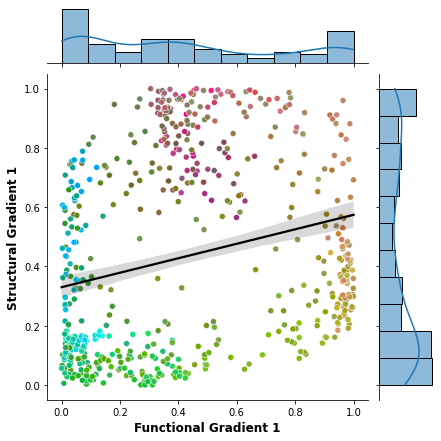

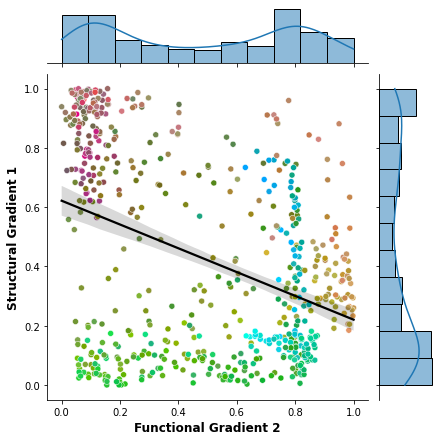

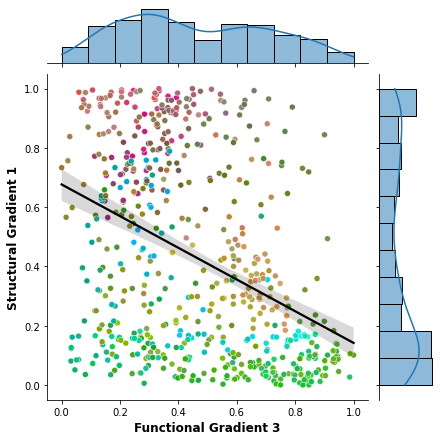

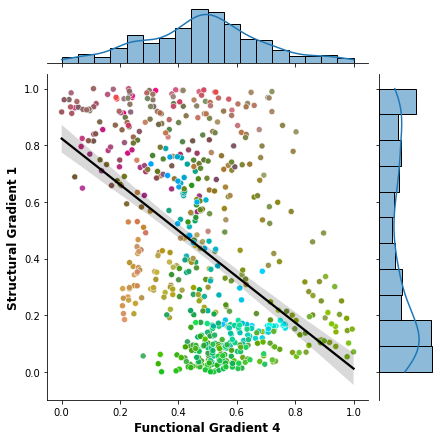

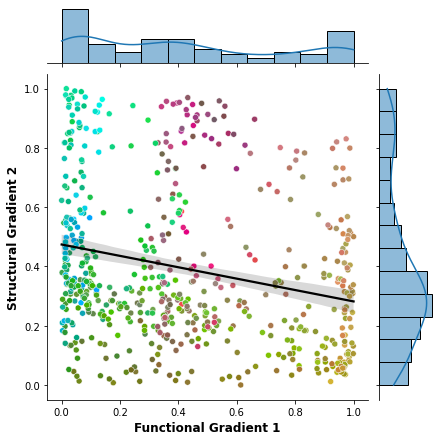

...

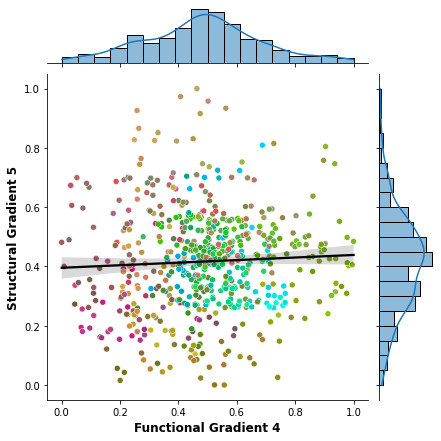

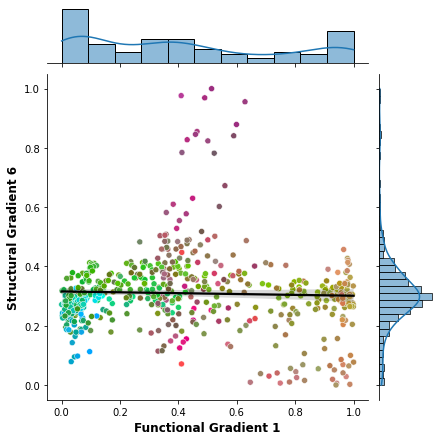

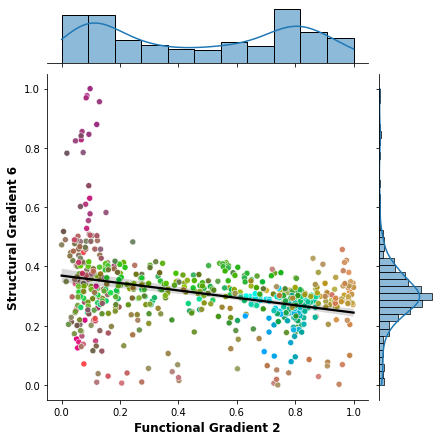

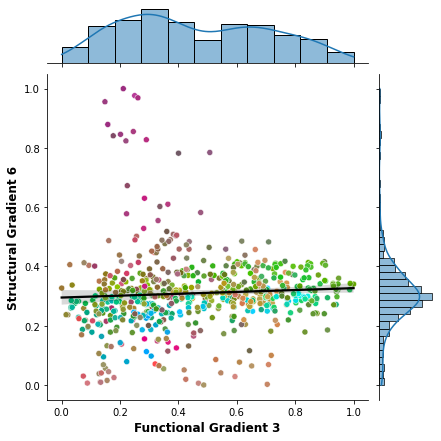

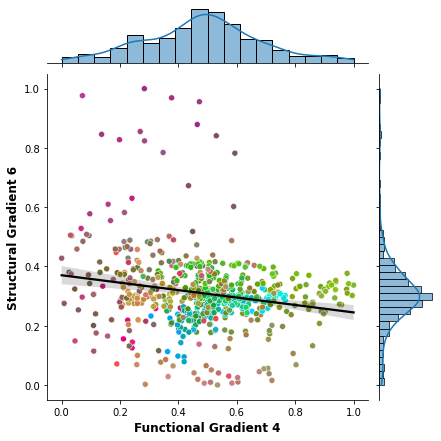

In [20]:
for dg in range(0,6): 
    for fg in range(0,4):
        
        x=func_rescaled[str(fg)].to_numpy()
        y=struct_rescaled[str(dg)].to_numpy()
        
        g = sns.JointGrid(x=x, y=y)
        g.plot_joint(sns.scatterplot, c=c_com)
        g.plot_marginals(sns.histplot, kde=True)
        g1 = sns.regplot(x=x, y=y, scatter=False, line_kws={'color': 'black'}, ax=g.ax_joint)
        g.set_axis_labels(xlabel=f'Functional Gradient '+str(fg+1), ylabel=f'Structural Gradient '+str(dg+1), weight='bold', fontsize=12)
        g.savefig(fig_path + f'BF_scaled_Gradients_correlation_and_distribution_Structural_g-'+ str(dg+1)+'_vs_Functional_g-'+ str(fg+1)+'.png', dpi=300)

### Calculating residuals for s6-f4 (variance based) combination

In [21]:
# load the data
rfmri_fname = (Func_results + 'Func_HCPMMP_gradient_{0}.nii.gz')
dmri_fname = (Diff_results + 'Diff_7Tsubj_gradient_{0}.nii.gz')

In [22]:
rsq_matrix = np.zeros((6,4))
pval_matrix = np.zeros((6,4))
resid_results = pd.DataFrame()

import statsmodels.api as sm
for dg in range(0,6):
    dmri_g = nib.load(dmri_fname.format(dg+1)).get_fdata()

    for fg in range(0,4):
        rfmri_g = nib.load(rfmri_fname.format(fg+1)).get_fdata()
        
        model = sm.OLS(rfmri_g[combined_mask==1].flatten(), dmri_g[combined_mask==1].flatten())
        results = model.fit()
        
        rsq_matrix[dg,fg] = results.rsquared
        pval_matrix[dg,fg] = results.pvalues
        resid_results[dg,fg] = pd.DataFrame(results.resid)

/home/ROBARTS/schakraborty/venv/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [129]:
rsq_matrix

array([[6.08750441e-02, 1.55495083e-01, 1.60109596e-01, 2.33649856e-01],
       [5.94027088e-02, 4.53062371e-04, 8.29973986e-03, 2.10555250e-03],
       [2.29109890e-01, 4.77459563e-04, 2.02447885e-03, 3.12743362e-03],
       [9.99054452e-02, 1.93982002e-01, 5.31941110e-03, 1.36951129e-04],
       [1.30548472e-03, 2.93163750e-03, 1.76015092e-02, 2.49286456e-03],
       [1.43617473e-03, 1.00977375e-01, 3.77289090e-03, 3.74275468e-02]])

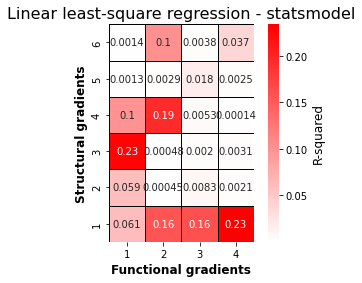

In [23]:
# plot r-squared to double check
fig, ax = plt.subplots(1,1, figsize=(5,4))
# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4] # labels for x-axis
y_axis_labels = [1,2,3,4,5,6] # labels for y-axis
sns.heatmap(rsq_matrix, cmap='bwr', center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'R-squared'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression - statsmodel', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_R-squared_statsmodels.png', dpi=300)
plt.show()

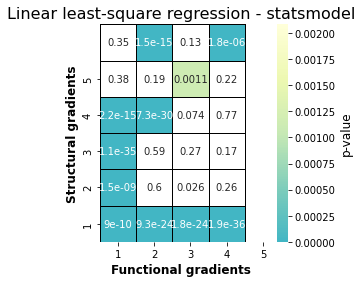

In [24]:
from copy import copy
#conditions for filtering p<=0.05
pval = 0.05/24
val_max = pval

fig, ax = plt.subplots(1,1, figsize=(5,4))

# Define the gradient labels so it starts from 1 instead of 0
x_axis_labels = [1,2,3,4,5] # labels for x-axis
y_axis_labels = [1,2,3,4,5] # labels for y-axis

#define the colormap with clipping values
my_cmap = copy(plt.cm.YlGnBu_r)
my_cmap.set_over("white")
my_cmap.set_under("white")

sns.heatmap(pval_matrix, vmax=val_max, cmap=my_cmap, center=0, linewidth=1, linecolor='black', square=True,
           cbar_kws={'label':'p-value'}, annot = True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

ax.figure.axes[-1].yaxis.label.set_size(12)
ax.invert_yaxis()
ax.set_ylabel('Structural gradients', weight='bold', fontsize=12)
ax.set_xlabel('Functional gradients', weight='bold', fontsize=12)
ax.set_title('Linear least-square regression - statsmodel', fontsize=16)
plt.savefig(fig_path + f'BF_Gradient_Struct_vs_Func_linear_least-squares_regression_s6-f4_p-values_statsmodels.png', dpi=300)
plt.show()

In [35]:
pd.DataFrame(resid_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv', index=False)

### (unweighted) residuals 

In [25]:
resid_results = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals_statsmodels.csv')

In [26]:
resid_results

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,-0.057653,-0.055553,0.001975,-0.016816,0.024720,-0.116090,-0.012252,-0.034254,-0.031991,-0.115583,...,-0.015312,-0.034813,-0.002606,-0.112736,-0.015119,-0.035477,-0.010807,-0.169982,-0.011050,-0.043502
1,-0.042537,-0.059177,0.004201,0.000010,0.018551,-0.121634,-0.012481,-0.019199,0.056339,-0.120440,...,-0.013806,-0.019032,0.013777,-0.117797,-0.014990,-0.020104,0.015474,-0.133543,-0.011926,-0.021056
2,-0.017267,-0.059772,-0.004495,0.011007,0.043890,-0.122275,-0.021186,-0.008215,0.076051,-0.121245,...,-0.022454,-0.008058,0.039540,-0.118876,-0.023413,-0.009019,0.040531,-0.135574,-0.020562,-0.010286
3,-0.057767,-0.055482,0.001809,-0.016923,-0.016341,-0.114295,-0.015249,-0.035831,0.102488,-0.112174,...,-0.015208,-0.035182,-0.008353,-0.107231,-0.019380,-0.037184,0.005734,-0.083269,-0.015843,-0.030444
4,-0.045108,-0.068165,-0.003121,-0.015820,0.022789,-0.122687,-0.016461,-0.031846,-0.018816,-0.122523,...,-0.018964,-0.032119,0.007340,-0.122480,-0.017038,-0.032178,0.000039,-0.157508,-0.015672,-0.037814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.250117,0.118244,0.012219,-0.031093,0.206290,0.134066,0.014068,-0.027671,0.171875,0.130442,...,0.017239,-0.026932,0.241604,0.127398,0.019214,-0.025594,0.235787,0.128462,0.016203,-0.027339
595,0.246290,0.130194,0.017884,-0.029380,0.232257,0.139180,0.019845,-0.026883,0.156189,0.136439,...,0.023763,-0.027252,0.231528,0.145081,0.016179,-0.028152,0.244222,0.173076,0.018460,-0.021471
596,0.232110,0.136999,0.017400,-0.025150,0.209124,0.134529,0.014611,-0.027203,0.169937,0.131055,...,0.019402,-0.026848,0.238699,0.130347,0.018055,-0.025762,0.232139,0.112234,0.017392,-0.029560
597,0.244702,0.140372,0.020918,-0.026297,0.256860,0.140327,0.021922,-0.025694,0.145182,0.138126,...,0.026485,-0.026909,0.230381,0.154332,0.012501,-0.029166,0.248484,0.165189,0.019867,-0.022392


In [27]:
# square 
resid_squared = resid_results**2
#resid_squared

In [28]:
pd.DataFrame(resid_squared).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv', index=False)

In [29]:
resid_squared = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [30]:
resid_squared

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(1, 1)","(1, 2)","(1, 3)","(2, 0)","(2, 1)",...,"(3, 2)","(3, 3)","(4, 0)","(4, 1)","(4, 2)","(4, 3)","(5, 0)","(5, 1)","(5, 2)","(5, 3)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.013477,0.000150,0.001173,0.001023,0.013359,...,0.000234,0.001212,0.000007,0.012709,0.000229,0.001259,1.167867e-04,0.028894,0.000122,0.001892
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.014795,0.000156,0.000369,0.003174,0.014506,...,0.000191,0.000362,0.000190,0.013876,0.000225,0.000404,2.394591e-04,0.017834,0.000142,0.000443
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.014951,0.000449,0.000067,0.005784,0.014700,...,0.000504,0.000065,0.001563,0.014131,0.000548,0.000081,1.642754e-03,0.018380,0.000423,0.000106
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.013063,0.000233,0.001284,0.010504,0.012583,...,0.000231,0.001238,0.000070,0.011499,0.000376,0.001383,3.287833e-05,0.006934,0.000251,0.000927
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.015052,0.000271,0.001014,0.000354,0.015012,...,0.000360,0.001032,0.000054,0.015001,0.000290,0.001035,1.498620e-09,0.024809,0.000246,0.001430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.017974,0.000198,0.000766,0.029541,0.017015,...,0.000297,0.000725,0.058372,0.016230,0.000369,0.000655,5.559553e-02,0.016502,0.000263,0.000747
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.019371,0.000394,0.000723,0.024395,0.018616,...,0.000565,0.000743,0.053605,0.021048,0.000262,0.000793,5.964461e-02,0.029955,0.000341,0.000461
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.018098,0.000213,0.000740,0.028879,0.017175,...,0.000376,0.000721,0.056977,0.016990,0.000326,0.000664,5.388840e-02,0.012596,0.000302,0.000874
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.019692,0.000481,0.000660,0.021078,0.019079,...,0.000701,0.000724,0.053076,0.023818,0.000156,0.000851,6.174410e-02,0.027288,0.000395,0.000501


In [31]:
# average 
resid_sqsum = resid_squared.sum(axis=1)
resid_sqsum_np = resid_sqsum.to_numpy()

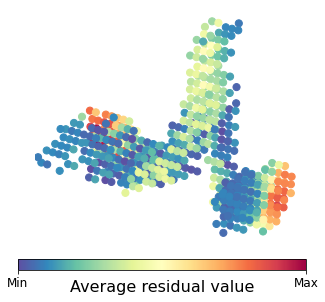

In [101]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_sqsum_np
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=resid_sqsum_np.min(), vmax=resid_sqsum_np.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[resid_sqsum_np.min(), resid_sqsum_np.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [33]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4',
               's2-f1','s2-f2','s2-f3','s2-f4',
               's3-f1','s3-f2','s3-f3','s3-f4',
               's4-f1','s4-f2','s4-f3','s4-f4',
               's5-f1','s5-f2','s5-f3','s5-f4',
               's6-f1','s6-f2','s6-f3','s6-f4']

In [34]:
np_resid_squared = resid_squared.to_numpy()

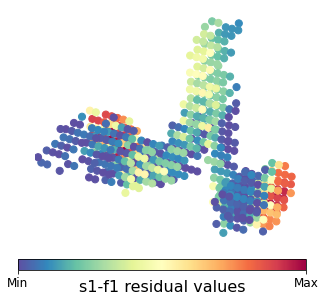

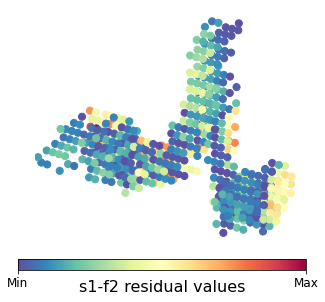

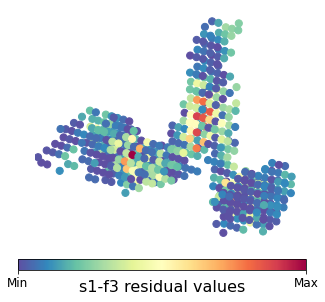

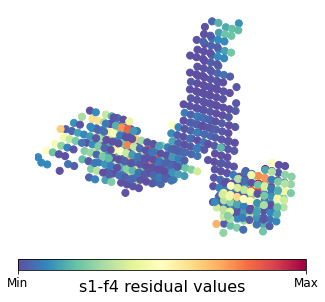

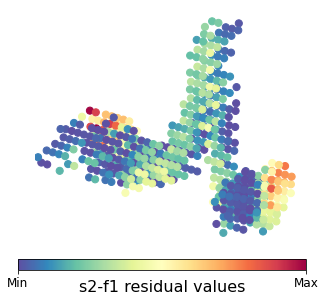

...

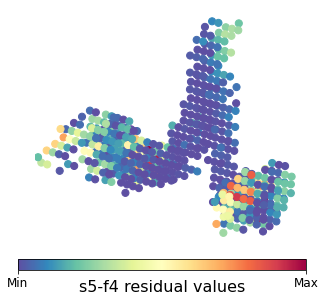

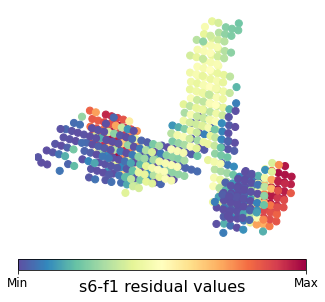

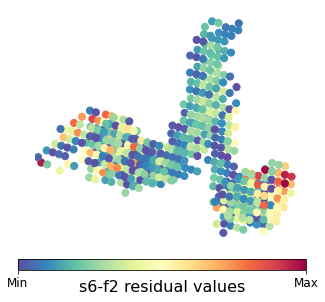

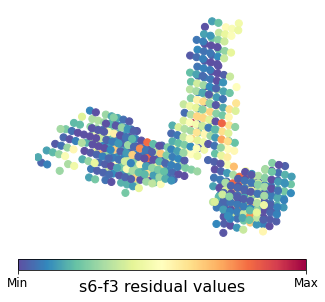

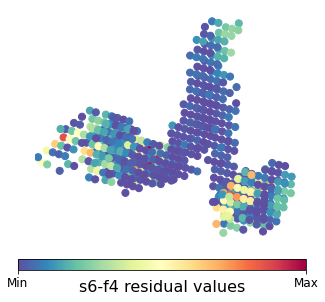

In [54]:
for res in range(24):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_squared[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_squared[:,res].min(), vmax=np_resid_squared[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_squared[:,res].min(), np_resid_squared[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

### weighted residuals 

In [35]:
Func_var = pd.read_csv(Func_results + 'Func_HCPMMP_gradients_variance_gm-100.csv')
Diff_var = pd.read_csv(Diff_results + 'Diff_7Tsubj_gradients_variance_gm-100.csv') 
resid_squared = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_s6-f4_residuals-squared.csv')

In [36]:
func_var = Func_var.to_numpy()
diff_var = Diff_var.to_numpy()
np_resid_squared = resid_squared.to_numpy()

In [37]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4',
               's2-f1','s2-f2','s2-f3','s2-f4',
               's3-f1','s3-f2','s3-f3','s3-f4',
               's4-f1','s4-f2','s4-f3','s4-f4',
               's5-f1','s5-f2','s5-f3','s5-f4',
               's6-f1','s6-f2','s6-f3','s6-f4']

In [38]:
weight = np.zeros((6,4))
for s in range(6):
    for f in range(4):
        weight[s,f] = diff_var[s]+func_var[f]

In [39]:
weight = weight.reshape(24)
weighted_sqresid = pd.DataFrame(columns=combination)
for sf in range(24):
    ind = resid_squared.columns[sf]
    weighted_sqresid[combination[sf]] = resid_squared[ind]*weight[sf]

In [40]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.001985,0.001520,0.000001,9.862665e-05,0.000261,0.004347,0.000027,0.000210,0.000408,0.003935,...,0.000030,0.000155,0.000002,0.003067,0.000023,0.000123,3.931940e-05,0.006712,0.000011,1.673290e-04
1,0.001080,0.001725,0.000006,3.718602e-11,0.000147,0.004772,0.000028,0.000066,0.001266,0.004273,...,0.000025,0.000046,0.000066,0.003348,0.000022,0.000039,8.062042e-05,0.004143,0.000013,3.920216e-05
2,0.000178,0.001760,0.000007,4.225675e-05,0.000822,0.004823,0.000081,0.000012,0.002308,0.004330,...,0.000066,0.000008,0.000540,0.003410,0.000055,0.000008,5.530777e-04,0.004270,0.000038,9.355681e-06
3,0.001992,0.001517,0.000001,9.989260e-05,0.000114,0.004214,0.000042,0.000229,0.004191,0.003707,...,0.000030,0.000158,0.000024,0.002774,0.000038,0.000135,1.106938e-05,0.001611,0.000023,8.194774e-05
4,0.001215,0.002289,0.000003,8.729172e-05,0.000222,0.004855,0.000049,0.000181,0.000141,0.004422,...,0.000047,0.000132,0.000019,0.003620,0.000029,0.000101,5.045512e-10,0.005763,0.000022,1.264278e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.037351,0.006888,0.000052,3.372004e-04,0.018169,0.005798,0.000036,0.000137,0.011786,0.005012,...,0.000039,0.000093,0.020177,0.003916,0.000037,0.000064,1.871775e-02,0.003833,0.000024,6.608718e-05
595,0.036216,0.008351,0.000112,3.010717e-04,0.023031,0.006249,0.000071,0.000129,0.009733,0.005484,...,0.000073,0.000095,0.018529,0.005079,0.000026,0.000077,2.008098e-02,0.006958,0.000031,4.076092e-05
596,0.032166,0.009247,0.000106,2.206169e-04,0.018672,0.005838,0.000039,0.000132,0.011521,0.005060,...,0.000049,0.000092,0.019695,0.004099,0.000033,0.000065,1.814300e-02,0.002926,0.000028,7.726005e-05
597,0.035751,0.009708,0.000154,2.412036e-04,0.028169,0.006352,0.000087,0.000118,0.008409,0.005620,...,0.000091,0.000092,0.018346,0.005747,0.000016,0.000083,2.078783e-02,0.006339,0.000036,4.433386e-05


In [195]:
pd.DataFrame(weighted_sqresid).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv', index=False)

In [41]:
weighted_sqresid = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [42]:
weighted_sqresid

,s1-f1,s1-f2,s1-f3,s1-f4,s2-f1,s2-f2,s2-f3,s2-f4,s3-f1,s3-f2,...,s4-f3,s4-f4,s5-f1,s5-f2,s5-f3,s5-f4,s6-f1,s6-f2,s6-f3,s6-f4
0,0.001985,0.001520,0.000001,9.862665e-05,0.000261,0.004347,0.000027,0.000210,0.000408,0.003935,...,0.000030,0.000155,0.000002,0.003067,0.000023,0.000123,3.931940e-05,0.006712,0.000011,1.673290e-04
1,0.001080,0.001725,0.000006,3.718602e-11,0.000147,0.004772,0.000028,0.000066,0.001266,0.004273,...,0.000025,0.000046,0.000066,0.003348,0.000022,0.000039,8.062042e-05,0.004143,0.000013,3.920216e-05
2,0.000178,0.001760,0.000007,4.225675e-05,0.000822,0.004823,0.000081,0.000012,0.002308,0.004330,...,0.000066,0.000008,0.000540,0.003410,0.000055,0.000008,5.530777e-04,0.004270,0.000038,9.355681e-06
3,0.001992,0.001517,0.000001,9.989260e-05,0.000114,0.004214,0.000042,0.000229,0.004191,0.003707,...,0.000030,0.000158,0.000024,0.002774,0.000038,0.000135,1.106938e-05,0.001611,0.000023,8.194774e-05
4,0.001215,0.002289,0.000003,8.729172e-05,0.000222,0.004855,0.000049,0.000181,0.000141,0.004422,...,0.000047,0.000132,0.000019,0.003620,0.000029,0.000101,5.045512e-10,0.005763,0.000022,1.264278e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594,0.037351,0.006888,0.000052,3.372004e-04,0.018169,0.005798,0.000036,0.000137,0.011786,0.005012,...,0.000039,0.000093,0.020177,0.003916,0.000037,0.000064,1.871775e-02,0.003833,0.000024,6.608718e-05
595,0.036216,0.008351,0.000112,3.010717e-04,0.023031,0.006249,0.000071,0.000129,0.009733,0.005484,...,0.000073,0.000095,0.018529,0.005079,0.000026,0.000077,2.008098e-02,0.006958,0.000031,4.076092e-05
596,0.032166,0.009247,0.000106,2.206169e-04,0.018672,0.005838,0.000039,0.000132,0.011521,0.005060,...,0.000049,0.000092,0.019695,0.004099,0.000033,0.000065,1.814300e-02,0.002926,0.000028,7.726005e-05
597,0.035751,0.009708,0.000154,2.412036e-04,0.028169,0.006352,0.000087,0.000118,0.008409,0.005620,...,0.000091,0.000092,0.018346,0.005747,0.000016,0.000083,2.078783e-02,0.006339,0.000036,4.433386e-05


In [43]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1).to_numpy()
weighted_sumsq.shape

(599,)

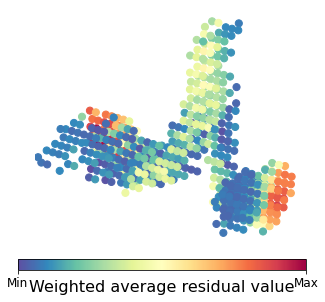

In [100]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=weighted_sumsq
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=weighted_sumsq.min(), vmax=weighted_sumsq.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[weighted_sumsq.min(), weighted_sumsq.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Weighted average residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_weighted-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [204]:
np_weighted_sqresid = weighted_sqresid.to_numpy()
np_weighted_sqresid.shape

(599, 24)

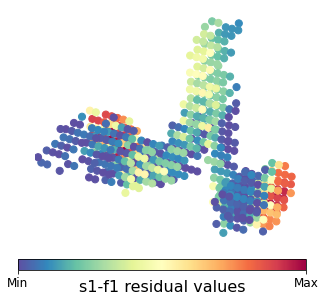

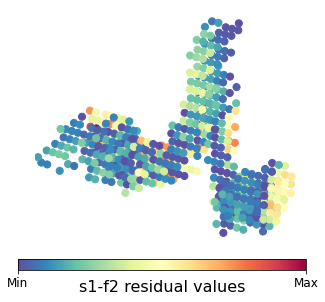

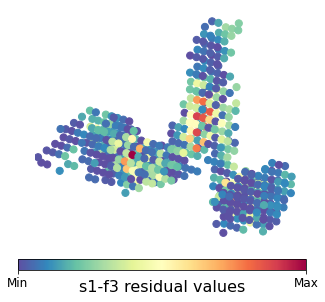

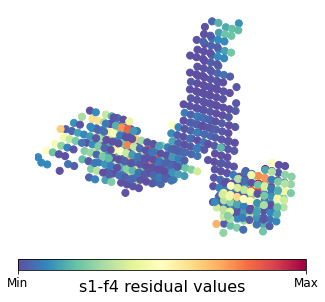

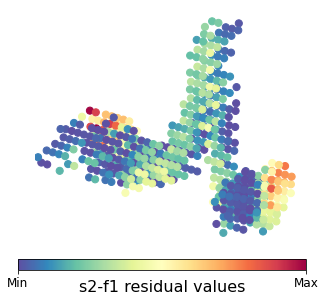

...

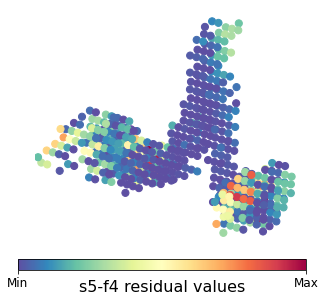

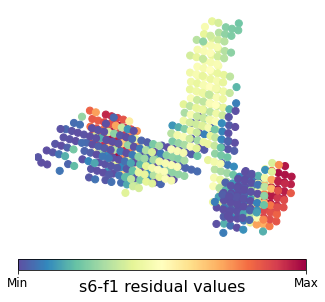

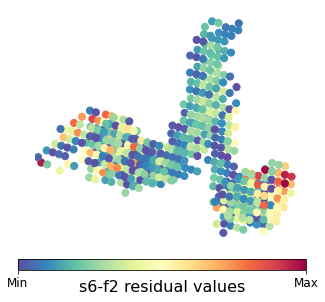

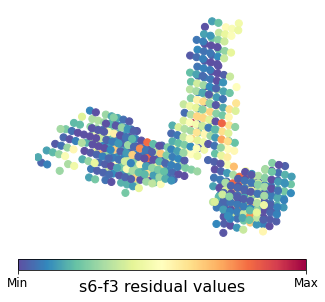

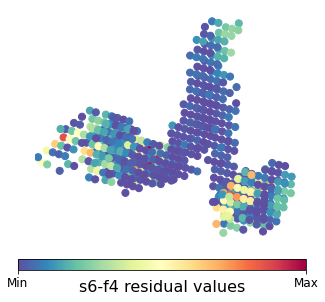

In [205]:
for res in range(24):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_weighted_sqresid[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_weighted_sqresid[:,res].min(), vmax=np_weighted_sqresid[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_weighted_sqresid[:,res].min(), np_weighted_sqresid[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_weighted-'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

### Residual in atlas subregions

#### loading BF atlas and visualize with 3D scatter plot for ref

In [45]:
fname = (data_path + 'BF_masked_fullB_3seg1p6mm.dseg.nii.gz')

In [46]:
bf_nii = nib.load(fname).get_fdata()
bf_idx = np.argwhere(bf_nii)
bf_values = bf_nii[bf_idx[:,0], bf_idx[:,1], bf_idx[:,2]].flatten()

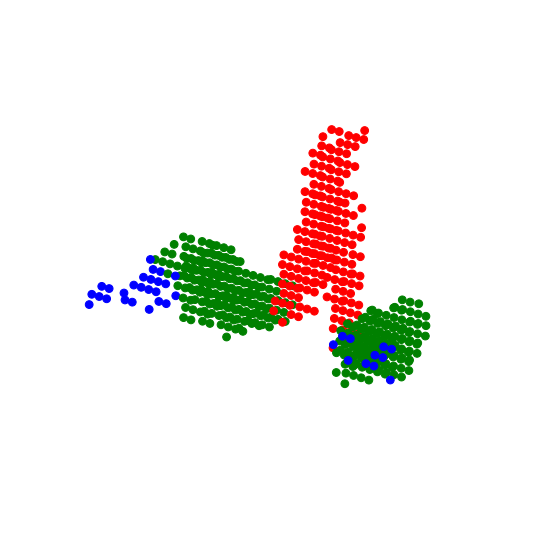

In [48]:
from matplotlib.colors import ListedColormap
colors = ListedColormap(['red', 'green', 'blue'])

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')
ax.dist=10
ax.set_axis_off()
    
ax.scatter(
    bf_idx[:,0],
    bf_idx[:,1],
    bf_idx[:,2],
    s=60, alpha=1,
    cmap=colors,
    c=bf_values
)

plt.savefig(fig_path+f'BF-atlas_color-ref.png', dpi=300, bbox_inches='tight')
plt.show()

#### loading weighted residul data and plotting against BF atlas

In [49]:
weighted_sqresid = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_weighted-s6-f4_residuals_statsmodels.csv')

In [50]:
# sum
weighted_sumsq = weighted_sqresid.sum(axis=1).to_numpy()
weighted_sumsq.shape

(599,)

In [52]:
combined_mask = np.zeros_like(dmri_mask)
combined_mask[(dmri_mask==1) & (rfmri_mask==1) & (bf_nii!=0)] = 1

In [54]:
bf_atlas_masked = bf_nii*combined_mask

In [31]:
np.count_nonzero(bf_atlas_masked)

599

In [32]:
bf_atlas_masked.shape

(113, 136, 113)

In [55]:
resid_wsig_sum_vol = np.zeros(combined_mask.shape)
resid_wsig_sum_vol[ijk_indices[:,0].astype(int),ijk_indices[:,1].astype(int),ijk_indices[:,2].astype(int)] = weighted_sumsq

In [58]:
df = pd.DataFrame(
    dict(
        resid=resid_wsig_sum_vol[bf_atlas_masked!=0].flatten(),
        labels=bf_atlas_masked[bf_atlas_masked!=0].flatten(),
        funcG1=rfmri_g1[bf_atlas_masked!=0].flatten(),
        diffG1=dmri_g1[bf_atlas_masked!=0].flatten()
    )
)

In [59]:
pd.DataFrame(df).to_csv(results_path + 'BF_atlas-3label_weighted-resid_FG1_SG1.csv', index=False)

In [60]:
df = pd.read_csv(results_path + 'BF_atlas-3label_weighted-resid_FG1_SG1.csv')

In [66]:
labels = ['Ch123', 'Ch4', 'Ch4p']

##### boxplot

In [64]:
resid_Ch123 = resid_wsig_sum_vol[bf_atlas_masked == 1]
resid_Ch4 = resid_wsig_sum_vol[bf_atlas_masked == 2]
resid_Ch4p = resid_wsig_sum_vol[bf_atlas_masked == 3]
resid = [resid_Ch123, resid_Ch4, resid_Ch4p]

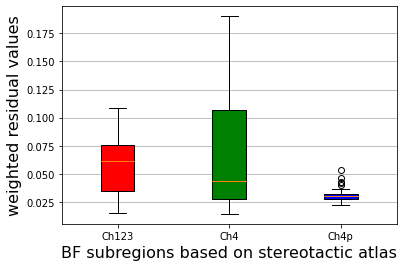

In [67]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))

# rectangular box plot
bplot = ax.boxplot(resid,
                     vert=True,  # vertical box alignment
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
#ax.set_title('weighted residual', fontsize=16)

# fill with colors
colors = ['red', 'green', 'blue']
for patch, color in zip(bplot['boxes'], colors):
    patch.set_facecolor(color)

# adding horizontal grid lines
ax.yaxis.grid(True)
ax.set_xlabel('BF subregions based on stereotactic atlas', fontsize=16)
ax.set_ylabel('weighted residual values', fontsize=16)

plt.savefig(fig_path+f'BF-atlas_weighted-resid_boxplot.png', dpi=300, bbox_inches='tight')
plt.show()

#### strip plot (& extra scatter plots)

<function matplotlib.pyplot.show(close=None, block=None)>

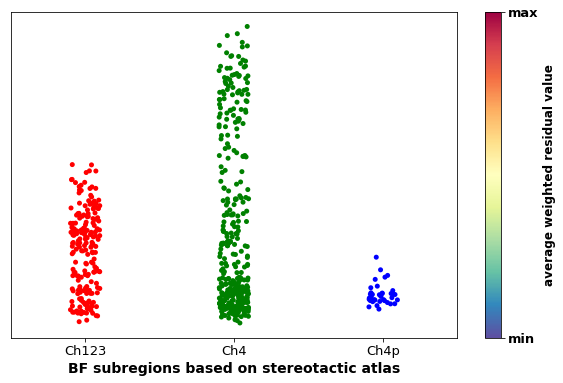

In [71]:
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots(figsize=(10, 6))
ax = sns.stripplot(data=df, x="labels", y="resid", palette=['red', 'green', 'blue'])
ax.set_xticklabels(labels)
plt.xlabel('BF subregions based on stereotactic atlas', size=14, weight=900)
plt.ylabel("")
#plt.title('average weighted residual values', size=14, weight=900)
plt.xticks(size=13)
plt.yticks([])

cmap = plt.get_cmap("Spectral_r")
norm = plt.Normalize(df['resid'].min(), df['resid'].max())
sm =  ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, ticks=[df['resid'].min(), df['resid'].max()])
cbar.ax.set_yticklabels(['min','max'], fontsize=13, weight=600)
cbar.ax.set_ylabel("average weighted residual value", fontsize=12, weight=600)
#cbar.ax.set_title("G1", fontsize=12, weight=900)

plt.savefig(fig_path+f'BF-atlas_weighted-resid__stripplot.png', dpi=300, bbox_inches='tight')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

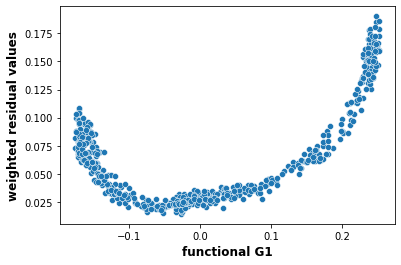

In [72]:
#labels = ['Ch123', 'Ch4', 'Ch4p']
fig, ax = plt.subplots(figsize=(6, 4))
ax = sns.scatterplot(data=df, x="funcG1", y="resid", palette="Spectral_r")
#ax.set_xticklabels(labels)
plt.xlabel('functional G1', size=12, weight=900)
plt.ylabel('weighted residual values', size=12, weight=900)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

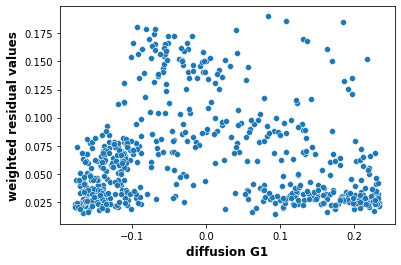

In [74]:
#labels = ['Ch123', 'Ch4', 'Ch4p']
fig, ax = plt.subplots(figsize=(6, 4))
ax = sns.scatterplot(data=df, x="diffG1", y="resid", palette="Spectral_r")
#ax.set_xticklabels(labels)
plt.xlabel('diffusion G1', size=12, weight=900)
plt.ylabel('weighted residual values', size=12, weight=900)
plt.show

#### stats

In [91]:
df

,resid,labels,funcG1,diffG1
0,0.025630,3.0,-0.000632,0.219320
1,0.024526,3.0,0.017674,0.231589
2,0.027861,3.0,0.042986,0.231753
3,0.023781,3.0,-0.000140,0.221652
4,0.026358,3.0,0.006611,0.198926
...,...,...,...,...
594,0.151444,2.0,0.236503,-0.052365
595,0.149958,2.0,0.237930,-0.032154
596,0.138827,2.0,0.235959,0.014806
597,0.150802,2.0,0.244045,-0.002528


In [95]:
import pingouin as pg
aov = pg.welch_anova(dv='resid', between='labels', data=df)

In [97]:
pg.print_table(aov, floatfmt='.6f')


ANOVA SUMMARY

Source      ddof1       ddof2           F     p-unc       np2
--------  -------  ----------  ----------  --------  --------
labels          2  305.891211  142.287253  0.000000  0.047608



In [98]:
posthoc = pg.pairwise_gameshowell(dv='resid', between='labels', data=df)

In [99]:
pg.print_table(posthoc, floatfmt='.6f')


POST HOC TESTS

       A         B    mean(A)    mean(B)       diff        se          T          df      pval     hedges
--------  --------  ---------  ---------  ---------  --------  ---------  ----------  --------  ---------
1.000000  2.000000   0.057735   0.068581  -0.010846  0.003150  -3.442584  555.223259  0.001791  -0.304890
1.000000  3.000000   0.057735   0.031303   0.026432  0.002020  13.084843  202.619862  0.000000   2.366725
2.000000  3.000000   0.068581   0.031303   0.037278  0.002853  13.066971  388.662918  0.000000   2.277343



### (OLD) getting the residuals of significant combinations

In [58]:
criteria = pval_matrix < pval

In [59]:
pval_col = criteria.reshape([25])

In [60]:
resid_sig = resid_results.loc[:, pval_col]

In [62]:
pd.DataFrame(resid_sig).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv', index=False)

In [65]:
resid_sig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv')
resid_sig

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,-0.057653,-0.055553,0.001975,-0.016816,0.024720,-0.031991,0.035652,-0.081865,-0.015119
1,-0.042537,-0.059177,0.004201,0.000010,0.018551,0.056339,0.049758,-0.092591,-0.014990
2,-0.017267,-0.059772,-0.004495,0.011007,0.043890,0.076051,0.073558,-0.094597,-0.023413
3,-0.057767,-0.055482,0.001809,-0.016923,-0.016341,0.102488,0.025057,-0.092442,-0.019380
4,-0.045108,-0.068165,-0.003121,-0.015820,0.022789,-0.018816,0.043685,-0.088267,-0.017038
...,...,...,...,...,...,...,...,...,...
594,0.250117,0.118244,0.012219,-0.031093,0.206290,0.171875,0.205273,0.104133,0.019214
595,0.246290,0.130194,0.017884,-0.029380,0.232257,0.156189,0.148055,0.057641,0.016179
596,0.232110,0.136999,0.017400,-0.025150,0.209124,0.169937,0.158295,0.062827,0.018055
597,0.244702,0.140372,0.020918,-0.026297,0.256860,0.145182,0.107910,0.018031,0.012501


#### squared sum significnat residuals (and average)

In [79]:
resid_sig_squared = resid_sig**2
resid_sig_squared

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.001023,0.001271,0.006702,0.000229
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.003174,0.002476,0.008573,0.000225
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.005784,0.005411,0.008949,0.000548
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.010504,0.000628,0.008546,0.000376
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.000354,0.001908,0.007791,0.000290
...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.029541,0.042137,0.010844,0.000369
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.024395,0.021920,0.003322,0.000262
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.028879,0.025057,0.003947,0.000326
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.021078,0.011645,0.000325,0.000156


In [80]:
resid_sig_sqsum = resid_sig_squared.sum(axis=1)

In [81]:
resid_sig_sqsum_np = resid_sig_sqsum.to_numpy()

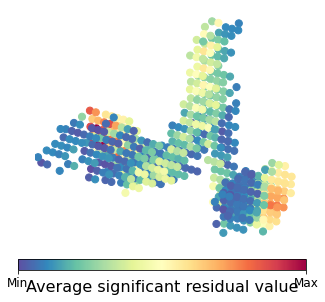

In [82]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_sig_sqsum
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=resid_sig_sqsum_np.min(), vmax=resid_sig_sqsum_np.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[resid_sig_sqsum_np.min(), resid_sig_sqsum_np.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average significant residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_significant-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [83]:
np_resid_sig_squared = resid_sig_squared.to_numpy()

In [88]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4','s2-f1','s3-f1','s4-f1','s4-f2','s5-f3']

In [87]:
np_resid_sig_squared[:,0].shape

(599,)

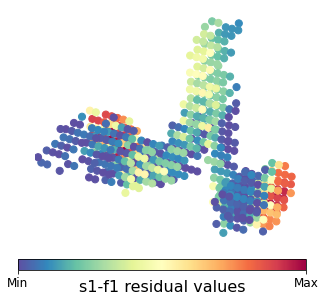

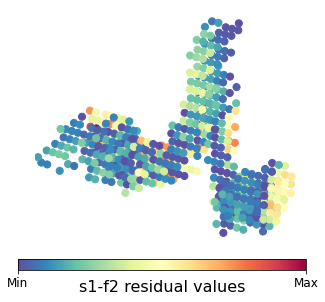

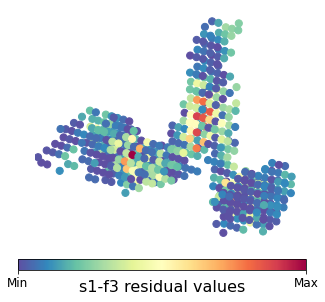

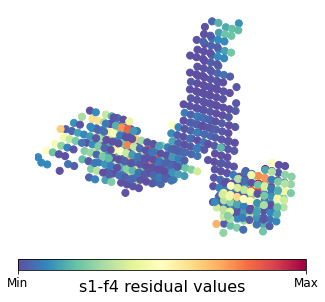

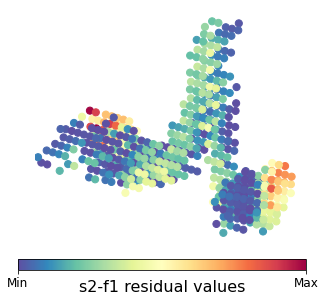

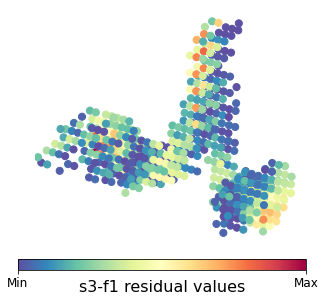

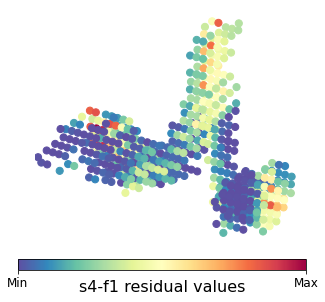

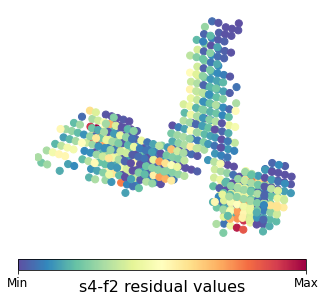

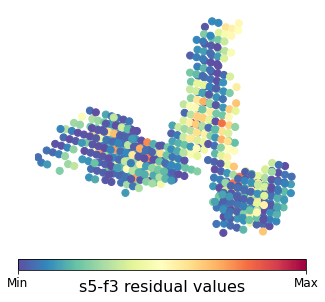

In [91]:
for res in range(9):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_sig_squared[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_sig_squared[:,res].min(), vmax=np_resid_sig_squared[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_sig_squared[:,res].min(), np_resid_sig_squared[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_residuals.png', dpi=300, bbox_inches='tight')
    plt.show()

#### Variance weighted squared sum significnat residuals (and average)

In [93]:
Func_var = pd.read_csv(Func_results + 'Func_HCPMMP_gradients_variance_gm-10.csv')
Diff_var = pd.read_csv(Diff_results + 'Diff_7Tsubj_gradients_variance_gm-10.csv')          

In [94]:
func_var = Func_var.to_numpy()
diff_var = Diff_var.to_numpy()

In [95]:
resid_sig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_significant-residuals_statsmodels.csv')
resid_square_results = resid_sig**2

In [96]:
resid_square_results

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.003324,0.003086,0.000004,2.827642e-04,0.000611,0.001023,0.001271,0.006702,0.000229
1,0.001809,0.003502,0.000018,1.066129e-10,0.000344,0.003174,0.002476,0.008573,0.000225
2,0.000298,0.003573,0.000020,1.211508e-04,0.001926,0.005784,0.005411,0.008949,0.000548
3,0.003337,0.003078,0.000003,2.863937e-04,0.000267,0.010504,0.000628,0.008546,0.000376
4,0.002035,0.004646,0.000010,2.502668e-04,0.000519,0.000354,0.001908,0.007791,0.000290
...,...,...,...,...,...,...,...,...,...
594,0.062559,0.013982,0.000149,9.667588e-04,0.042556,0.029541,0.042137,0.010844,0.000369
595,0.060659,0.016950,0.000320,8.631773e-04,0.053943,0.024395,0.021920,0.003322,0.000262
596,0.053875,0.018769,0.000303,6.325123e-04,0.043733,0.028879,0.025057,0.003947,0.000326
597,0.059879,0.019704,0.000438,6.915346e-04,0.065977,0.021078,0.011645,0.000325,0.000156


In [97]:
resid_square_results['(0, 0)'] = resid_square_results['(0, 0)']*(diff_var[0]+func_var[0])
resid_square_results['(0, 1)'] = resid_square_results['(0, 1)']*(diff_var[0]+func_var[1])
resid_square_results['(0, 2)'] = resid_square_results['(0, 2)']*(diff_var[0]+func_var[2])
resid_square_results['(0, 3)'] = resid_square_results['(0, 3)']*(diff_var[0]+func_var[3])
resid_square_results['(1, 0)'] = resid_square_results['(1, 0)']*(diff_var[1]+func_var[0])
resid_square_results['(2, 0)'] = resid_square_results['(2, 0)']*(diff_var[2]+func_var[0])
resid_square_results['(3, 0)'] = resid_square_results['(3, 0)']*(diff_var[3]+func_var[0])
resid_square_results['(3, 1)'] = resid_square_results['(3, 1)']*(diff_var[3]+func_var[1])
resid_square_results['(4, 2)'] = resid_square_results['(4, 2)']*(diff_var[4]+func_var[2])

In [99]:
pd.DataFrame(resid_square_results).to_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_sum-variance-gm10-wighted-significant-residuals_statsmodels.csv', index=False)

In [100]:
resid_wsig = pd.read_csv(results_path + 'Struct_vs_Func_linear_least-squares_regression_sum-variance-gm10-wighted-significant-residuals_statsmodels.csv')

In [101]:
resid_wsig

,"(0, 0)","(0, 1)","(0, 2)","(0, 3)","(1, 0)","(2, 0)","(3, 0)","(3, 1)","(4, 2)"
0,0.002694,0.002040,0.000002,1.286166e-04,0.000362,0.000569,0.000669,0.002526,0.000031
1,0.001466,0.002315,0.000008,4.849338e-11,0.000204,0.001765,0.001303,0.003232,0.000031
2,0.000242,0.002361,0.000009,5.510600e-05,0.001141,0.003217,0.002849,0.003373,0.000074
3,0.002704,0.002035,0.000001,1.302675e-04,0.000158,0.005842,0.000331,0.003221,0.000051
4,0.001649,0.003071,0.000004,1.138350e-04,0.000308,0.000197,0.001005,0.002937,0.000039
...,...,...,...,...,...,...,...,...,...
594,0.050700,0.009241,0.000068,4.397347e-04,0.025198,0.016431,0.022184,0.004088,0.000050
595,0.049160,0.011203,0.000147,3.926202e-04,0.031941,0.013568,0.011541,0.001252,0.000036
596,0.043662,0.012405,0.000139,2.877011e-04,0.025895,0.016062,0.013192,0.001488,0.000044
597,0.048528,0.013023,0.000201,3.145477e-04,0.039066,0.011723,0.006131,0.000123,0.000021


In [102]:
resid_wsig_sum = resid_wsig.sum(axis=1)

In [104]:
np_resid_wsig_sum = resid_wsig_sum.to_numpy()

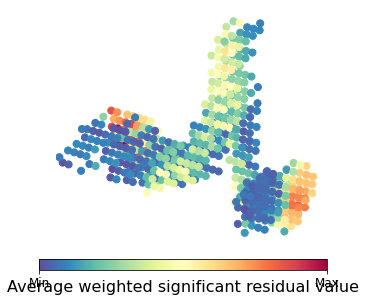

In [105]:
fig = plt.figure(figsize=(10,5))
ax2 = fig.add_subplot(projection='3d')
ax2.dist=6
ax2.set_axis_off()

ax2.scatter(
    ijk_indices[:,0],
    ijk_indices[:,1],
    ijk_indices[:,2],
    s=50, alpha=1,
    cmap='Spectral_r',
    c=resid_wsig_sum
)

# Add legend    
norm = matplotlib.colors.Normalize(vmin=np_resid_wsig_sum.min(), vmax=np_resid_wsig_sum.max())

cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                  ticks=[np_resid_wsig_sum.min(), np_resid_wsig_sum.max()],
                  cax=cb_ax, orientation='horizontal')
cb.set_label("Average weighted significant residual value", fontsize=16, labelpad=-10)
cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 

plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_significant-weighted-average_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

In [106]:
combination = ['s1-f1','s1-f2','s1-f3','s1-f4','s2-f1','s3-f1','s4-f1','s4-f2','s5-f3']

In [107]:
np_resid_wsig = resid_wsig.to_numpy()

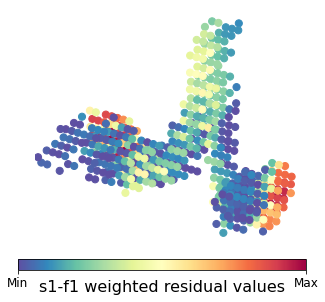

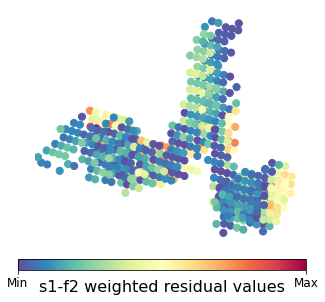

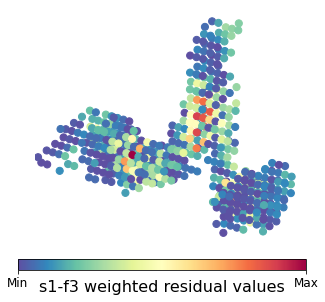

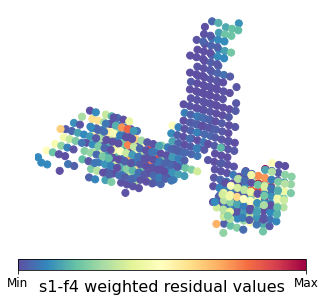

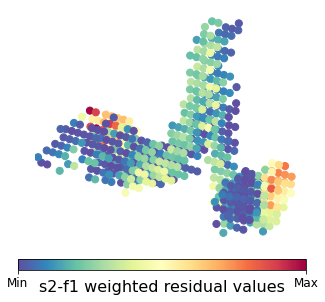

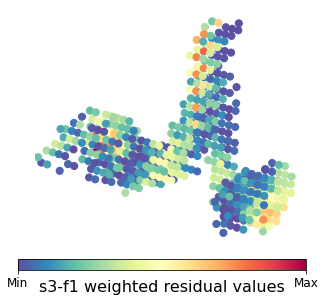

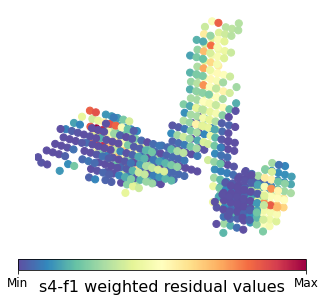

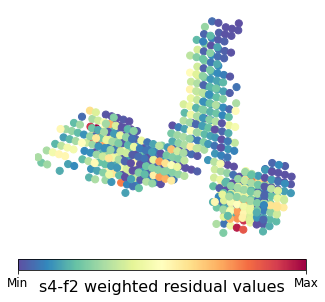

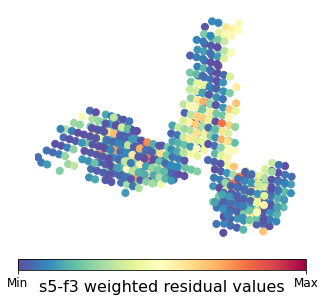

In [108]:
for res in range(9):
    fig = plt.figure(figsize=(10,5))
    ax2 = fig.add_subplot(projection='3d')
    ax2.dist=6
    ax2.set_axis_off()
    ax2.scatter(
        ijk_indices[:,0],
        ijk_indices[:,1],
        ijk_indices[:,2],
        s=50, alpha=1,
        cmap='Spectral_r',
        c=np_resid_wsig[:,res]
    )
    # Add legend    
    norm = matplotlib.colors.Normalize(vmin=np_resid_wsig[:,res].min(), vmax=np_resid_wsig[:,res].max())
    cb_ax = fig.add_axes([0.3, 0.15, 0.4, 0.03]) # start x, start y, length x, height y
    cb = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=matplotlib.cm.Spectral_r), 
                      ticks=[np_resid_wsig[:,res].min(), np_resid_wsig[:,res].max()],
                      cax=cb_ax, orientation='horizontal')
    cb.set_label(combination[res]+' weighted residual values', fontsize=16, labelpad=-10)
    cb.ax.set_xticklabels(['Min','Max'], fontsize=12) 
    plt.savefig(fig_path + f'BF_Struct_vs_Func_linear_least-squares_regression_'+combination[res]+'_weighted-residuals.png', dpi=300, bbox_inches='tight')
    plt.show()